# Predicting Smoking Status with tree-based models

# Introduction
Smoking has long been known as an activity detrimental to health. According to the [CDC](https://archive.cdc.gov/#/details?q=smoking&start=0&rows=10&url=https://www.cdc.gov/vitalsigns/adultsmoking/index.html), smoking is carcinogenic and can cause harm to nearly every organ in the body. By analyzing the variation in biological features associated with smoking, we can better understand **the mechanisms through which smoking causes harm and identify individuals with the highest risk factors**.

# Overview
In this assignment, we will practice building a machine learning system with the following guided tasks:

1) **Task 1**: Conduct exploratory data analysis and select representative features

2) **Task 2**: Implement and fine-tune a decision tree classifier, visualize and interprete the model to understand the relationship between the biological factors and smoking

3) **Task 3**: Implement a random forest classifier and compare it with a decision tree classifier to understand the pros and cons of each model

4) **Task 4**: Implement a decision tree regressor and compare it with the decision tree classifier to understand the differences between classification and regression models

5) **Optional task**: Explore how does different data preprocessing steps affect the performance of the decision tree classifier explored in Task2

# Data
The [dataset](https://www.kaggle.com/datasets/gauravduttakiit/smoker-status-prediction) contains 22 individial biological features and an indicator for smoking status.

**Target variable:**
- `smoking` (binary): smoking status of the person, 1 represents smoker, 0 for non-smoker

**Continuous/Numeric variables:**
- `age`: integer, the age of the person
- `height(cm)`: integer, the height of the person in centimeter
- `weight(kg)`: integer, the weight of the person in kilogram
- `waist(cm)`: integer, the waist of the person in centimeter
- `eyesight(left)`: float, the left eyesight of the person, range 0-10
- `eyesight(right)`: float, the left eyesight of the person, range 0-10
- `systolic`: integer, systolic blood pressure, the pressure in the arteries during ventricular contraction, normal range 90-120
- `relaxation`: integer, diastolic blood pressure, the pressure in the arteries during ventricular relaxation, normal range 60-80
- `fasting blood sugar`: integer, fasting blood sugar, healthy range < 125 mg/dL, high > 126 mg/dL
- `Cholesterol`: integer, total cholesterol level, high cholesterol could be caused by smoking or other unhealthy habits/diseaces, healthy range < 240 mg/dL, high > 240 mg/dL
- `triglyceride`: integer, triglyceride level, high triglycerides is a sign of increasing risk of heart disease. Healthy range < 200 mg/dL, high 201-500 mg/dL
- `HDL`: integer, HDL (high-density lipoprotein) cholesterol, high levels of HDL cholesterol can lower the risk for heart disease and stroke. Normal range > 40 mg/dL
- `LDL`: integer, LDL (low-density lipoprotein) cholesterol, high levels of LDL cholesterol raise the risk for heart disease and stroke. Normal range < 159 mg/dL
- `hemoglobin`: integer, measures the amount of hemoglobin in your blood, high hemoglobin level is usually a result of smoking, normal range 12.1 to 17.2 g/dL
- `serum creatinine`: float, the amount of creatinine in blood,  can be used to estimate how quickly the kidneys filter blood (glomerular filtration rate). Normal range 0.59 to 1.35 mg/dL.
- `AST`: integer, measures the level of AST enzyme in the blood, an increased AST level is often a sign of liver disease. Normal range 8 to 33 U/L.
- `ALT`: integer, measures the level of ALT enzyme, found mainly in the liver, in blood. Normal range 4 to 36 U/L.
- `Gtp`: integer, measures the amount of GTP enzyme in the blood, high diseases. Normal range 5 to 40 U/L.



**Categorical variables:**
- `hearing(left)`: dummy, the left year hearing capacity of the person, 1 represents normal hearing, 0 for disability in hearing
- `hearing(right)`: dummy, the right year hearing capacity of the person, same as hearing(left)
- `Urine protein`: integer, range from 1 to 6, protein level in urine, normal range <= 1
- `dental caries`: dummy, dental caries (tooth decay) of the person, 1 represents having tooth decay, usually associated with smoking, 0 represents no tooth decay


In [3]:
# import machine learning and visualization libraries
import os
import numpy as np
import pandas as pd
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

import seaborn as sns
import graphviz
import matplotlib.pyplot as plt
%matplotlib inline

# Exploratory Data Analysis

In [6]:
# Import data as a dataframe
data_path = "./" # change this to your path
df_data = pd.read_csv(os.path.join(data_path, 'smoke_dataset.csv'))

# Check the #samples and #features
df_data.shape

(38984, 23)

In [8]:
# first 5 rows of the dataframe
df_data.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0


In [10]:
# Print the data attributes/features
print(df_data.columns)

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'smoking'],
      dtype='object')


Check **missing** values and deal with missing values if necessary (refer to A1_EDA).

In [13]:
null_share = df_data.isna().sum()/len(df_data)
null_share[null_share>0]

Series([], dtype: float64)

There are no missing values in the dataset, which is great. If there were any missing values, we would need to deal with that before processing the data (refer to `A1_EDA`).

## Explore the target variable

Target variable: `smoking`

Check the **distribution** of the target variable.

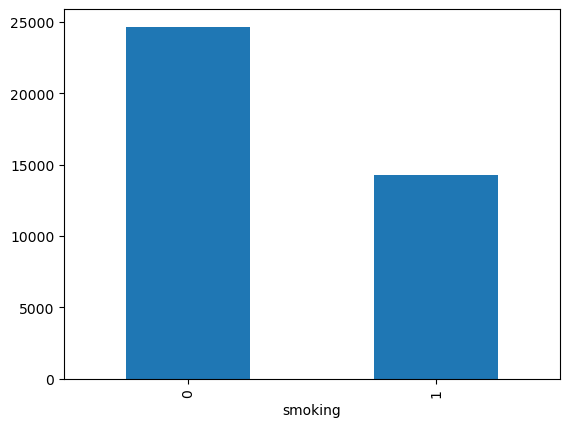

In [18]:
# 0 is not smoking and 1 is smoking
df_data.smoking.value_counts().plot(kind='bar');

This plot shows that our dataset is unbalanced (more non-smokers than smokers).

## Explore feature variables

We will organize the features by data type and process each type of feature separately.

In [22]:
# cat_features: categorical features; num_features: numerical features
cat_features = ['hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries']
num_features = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)',
                'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL',
                'hemoglobin', 'serum creatinine', 'AST','ALT', 'Gtp']

### Categorical feature processing

We will first check the feature **distribution** and then **encode** each feature.

In [26]:
df_cat = df_data[cat_features]

In [28]:
df_cat['hearing(left)'].value_counts()

hearing(left)
1    37995
2      989
Name: count, dtype: int64

In [30]:
df_cat['hearing(right)'].value_counts()

hearing(right)
1    37963
2     1021
Name: count, dtype: int64

In [32]:
df_cat['Urine protein'].value_counts()

Urine protein
1    36836
2     1236
3      667
4      182
5       58
6        5
Name: count, dtype: int64

In [34]:
df_cat['dental caries'].value_counts()

dental caries
0    30625
1     8359
Name: count, dtype: int64

- According to the distribution of each categorical feature, we will apply OneHotEncoder for each feature.
- Later on, we will have an additional discussion about **whether it is necessary** to encode categorical features and if we don't encode categorical features, how will this affect model performance.

In [37]:
# Initiate a one-hot encoder
ohe = OneHotEncoder(handle_unknown='ignore')
ohe.fit(df_cat)

# encode the features with the fitted encoder
df_cat_ohe = pd.DataFrame(ohe.transform(df_cat).toarray())

# rename columns to make it expressive
col_names = []
for i in range(len(cat_features)):
    for j in ohe.categories_[i]:
        col_names.append(cat_features[i] + '_' + str(j))

names_dict = {i:col_names[i] for i in range(len(col_names))}
df_cat_ohe.rename(columns=names_dict, inplace=True)
df_cat_ohe

,hearing(left)_1,hearing(left)_2,hearing(right)_1,hearing(right)_2,Urine protein_1,Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries_0,dental caries_1
0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
38979,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38980,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
38981,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38982,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Numerical feature processing

Check the data distribution and outliers of each numerical variable

In [41]:
df_num = df_data[num_features + ["smoking"]]

In [43]:
# create a function to organize the code
def check_outlier(df, col):
    '''takes a dataset df and a column name col as input, print the box plot and quantile statistics '''

    # Determine first and third quartiles
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)

    # Outliers defined as (Q1 - 1.5*IQR) or (Q3 + 1.5*IQR)
    IQR = Q3 - Q1
    lower_thresh = Q1 - 1.5*IQR
    upper_thresh = Q3 + 1.5*IQR
    print(f'{col} statistics: \nQ1: {Q1:.3f}; Q3: {Q3:.3f}; lower threshold: {lower_thresh:.1f}; upper threshold: {upper_thresh:.3f}')

    # Box plot to show data distribution
    sns.set_style("darkgrid",{'axes.grid' : True})
    sns.boxplot(data=df, x=col, y='smoking',  orient='h')
    plt.show()
    plt.clf()
    print()

In [45]:
df_num.columns

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar',
       'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin',
       'serum creatinine', 'AST', 'ALT', 'Gtp', 'smoking'],
      dtype='object')

age statistics: 
Q1: 40.000; Q3: 55.000; lower threshold: 17.5; upper threshold: 77.500


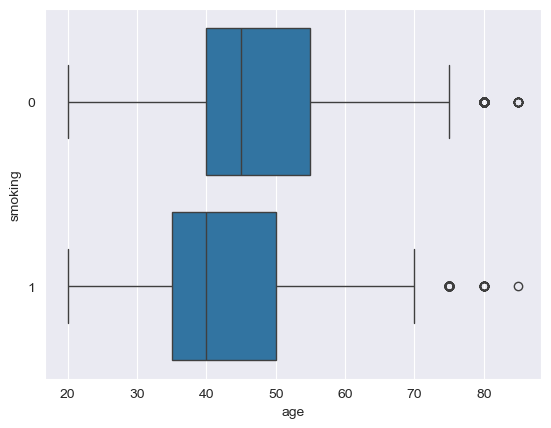


height(cm) statistics: 
Q1: 160.000; Q3: 170.000; lower threshold: 145.0; upper threshold: 185.000


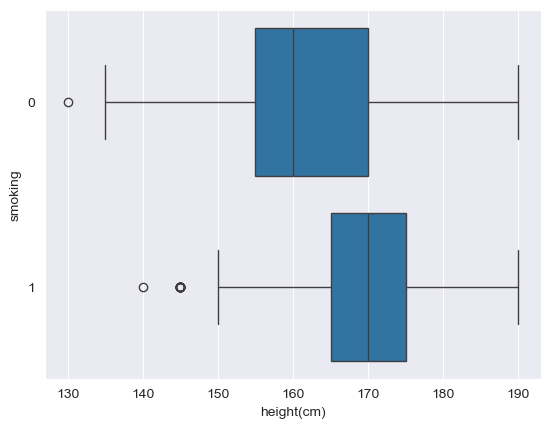


weight(kg) statistics: 
Q1: 55.000; Q3: 75.000; lower threshold: 25.0; upper threshold: 105.000


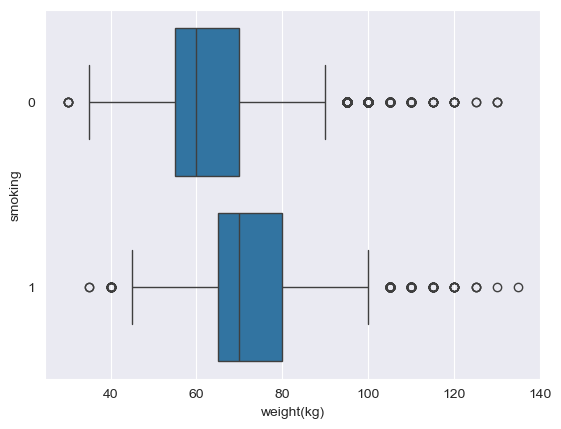


waist(cm) statistics: 
Q1: 76.000; Q3: 88.000; lower threshold: 58.0; upper threshold: 106.000


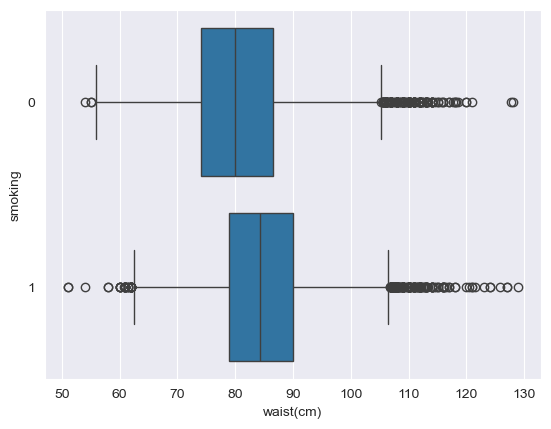


eyesight(left) statistics: 
Q1: 0.800; Q3: 1.200; lower threshold: 0.2; upper threshold: 1.800


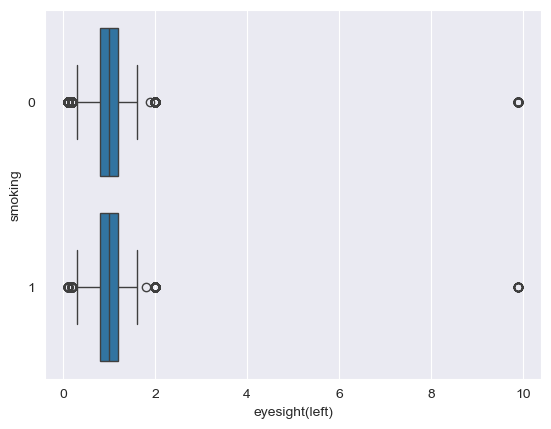


eyesight(right) statistics: 
Q1: 0.800; Q3: 1.200; lower threshold: 0.2; upper threshold: 1.800


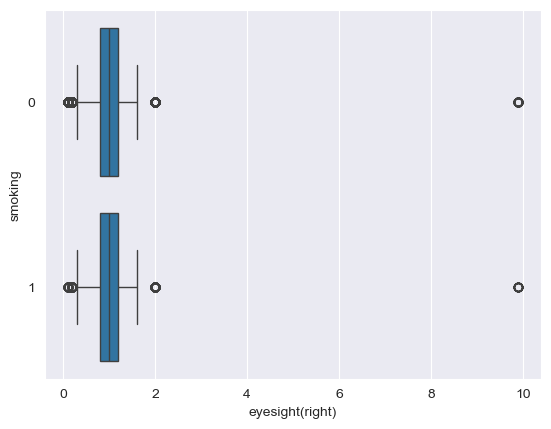


systolic statistics: 
Q1: 112.000; Q3: 130.000; lower threshold: 85.0; upper threshold: 157.000


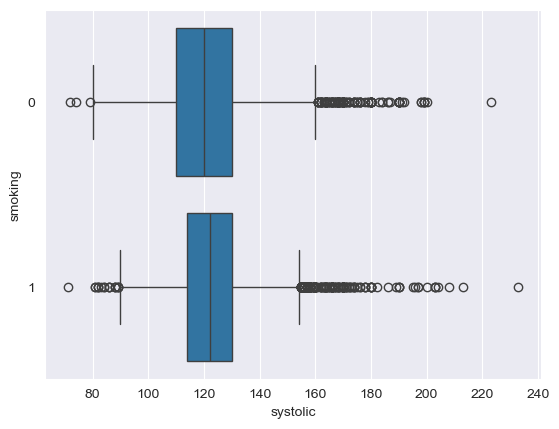


relaxation statistics: 
Q1: 70.000; Q3: 82.000; lower threshold: 52.0; upper threshold: 100.000


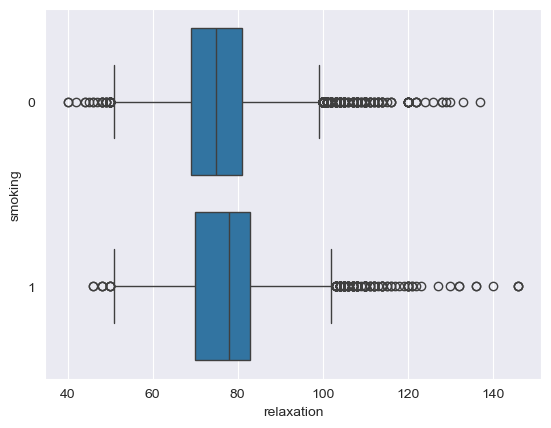


fasting blood sugar statistics: 
Q1: 89.000; Q3: 104.000; lower threshold: 66.5; upper threshold: 126.500


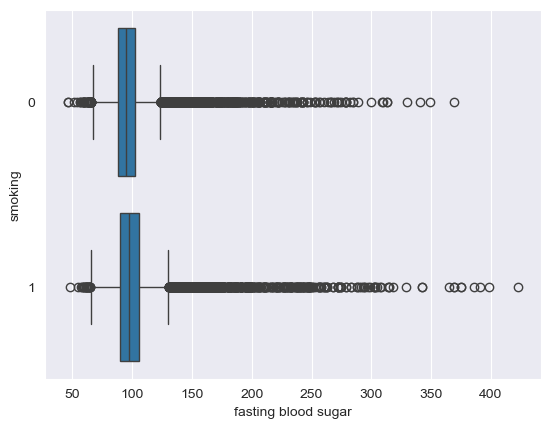


Cholesterol statistics: 
Q1: 172.000; Q3: 219.000; lower threshold: 101.5; upper threshold: 289.500


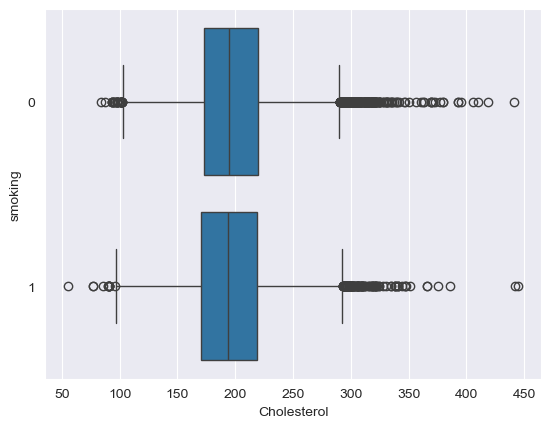


triglyceride statistics: 
Q1: 74.000; Q3: 160.000; lower threshold: -55.0; upper threshold: 289.000


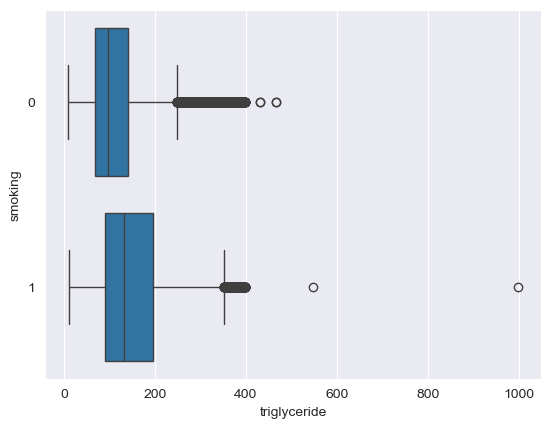


HDL statistics: 
Q1: 47.000; Q3: 66.000; lower threshold: 18.5; upper threshold: 94.500


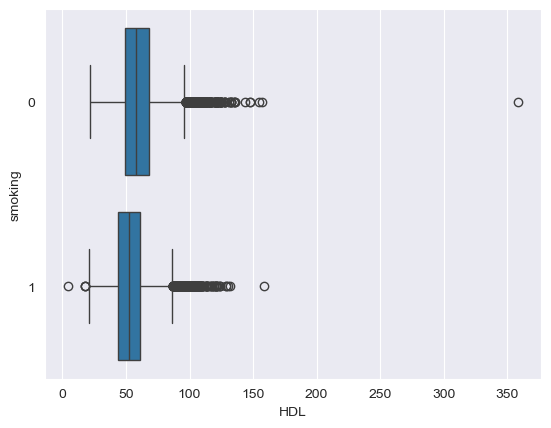


LDL statistics: 
Q1: 91.000; Q3: 136.000; lower threshold: 23.5; upper threshold: 203.500


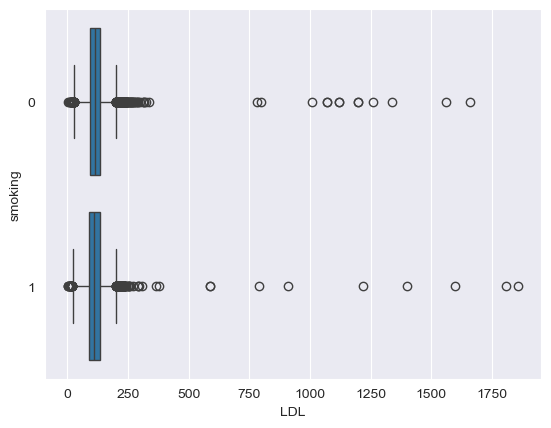


hemoglobin statistics: 
Q1: 13.600; Q3: 15.800; lower threshold: 10.3; upper threshold: 19.100


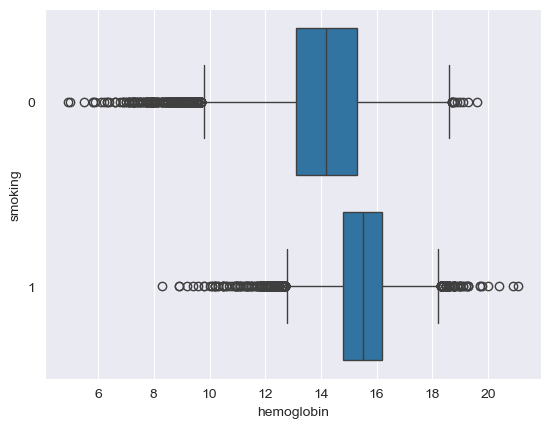


serum creatinine statistics: 
Q1: 0.800; Q3: 1.000; lower threshold: 0.5; upper threshold: 1.300


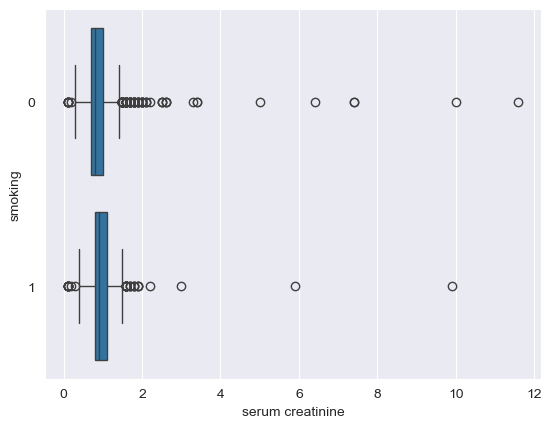


AST statistics: 
Q1: 19.000; Q3: 29.000; lower threshold: 4.0; upper threshold: 44.000


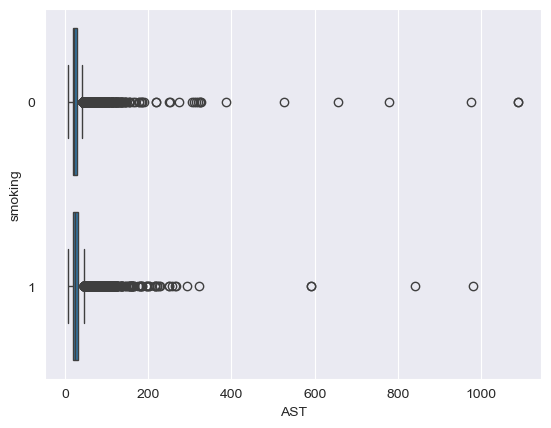


ALT statistics: 
Q1: 15.000; Q3: 31.000; lower threshold: -9.0; upper threshold: 55.000


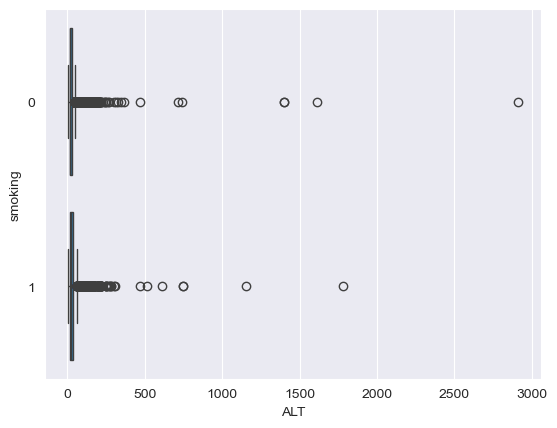


Gtp statistics: 
Q1: 17.000; Q3: 44.000; lower threshold: -23.5; upper threshold: 84.500


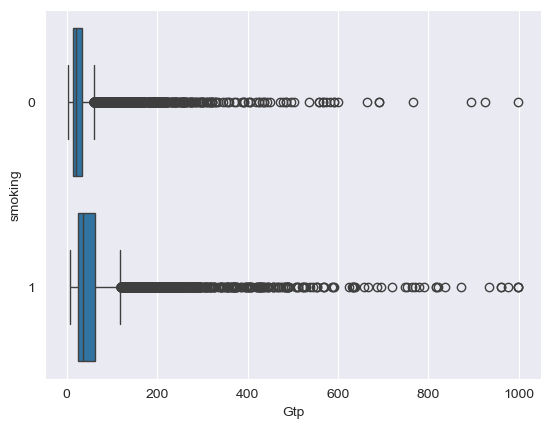

<Figure size 640x480 with 0 Axes>

In [47]:
# Loop through each column/feature and show information on each feature distribution
for col in num_features:
    check_outlier(df_num, col)

#### **Task 1.1: Feature Discussion**

We now have a large number of box and whisker plots showing us the within-group distributions of our features. You can never be too familiar with your data, so before moving any further let's pause a second to observe the distributions.


> __Your Task__: Take a moment and look at the above plots. What differences do you observe between the distributions of our predictive features for smokers and non-smokers? What stories can you read out of the data? Make two to three observations about the observed distributions, **discussing at least 5 features in the process**. Do any of the features or feature combinations seem likely to be highly predictive of whether an individual is a smoker or not?

>_NB: Generally speaking, we do not expect any long text responses in this assignment to take more than a paragraph. In fact, some prompts can likely be addressed in a sentence or two, so just use however much (or little!) room you need to fully address the prompt._

>_(Your answer goes here!): People who smoke are heavier, taller, and slightly younger--that is probably because it's mostly men who smoke.
> when considering the median, they are more "relaxe"
>smokers have higher trigryceride than non-smokers
> they possess much higher gtp, although there are lots of outliers, but we can see a larger range
> higher hemoglobin count, maybe smokers are younger?
>some distribution are quite difficult to tell the difference, maybe b/c of their scale, such as 

> I'd say, one specific, feature no... it's difficult to tell whether one is a smoker or not, but, by combining multiple features, it becomes easier to predict who smokes, etc!

We now **check feature colinearty** using a heatmap to show the correlation between every two features.

***Note***: *correlation heatmaps like that below can be really useful in your own work, so take note of how this was made!*

<!-- ${\tiny\text{Note from the TA: correlation heatmaps like that below can be really useful in your own work, so take note of how this was made!}}$ -->

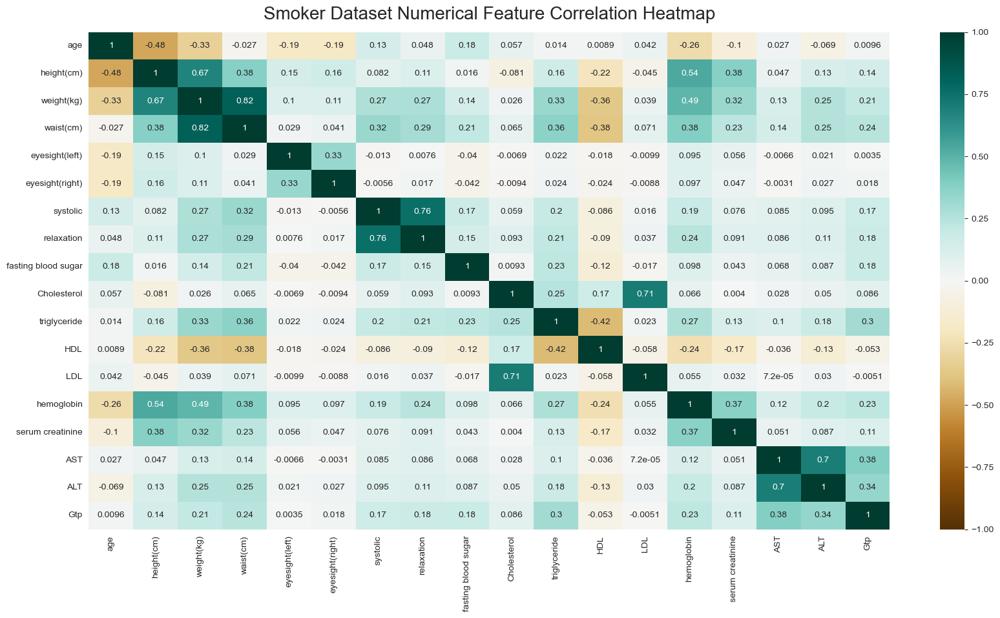

In [67]:
# set the size of the heatmap.
plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(df_data[num_features].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Set the title
heatmap.set_title('Smoker Dataset Numerical Feature Correlation Heatmap', fontdict={'fontsize':20}, pad=14);

#### **Task 1.2: Feature Trimming**

If we identify a pair of highly correlated features (i.e. features with $\vert \text{correlation}\vert \geq 0.7$), we will only keep one and remove the others.

> __Your Task__: Use the above correlation plot to identify highly correlated pairs of features. Define a list `new_num_features` which is just `num_features` but without highly correlated features. Then, explain why we want to remove highly correlated features. What problems can these pose for our models?

In [76]:
new_num_features = ['age',
 'weight(kg)',
 'eyesight(left)',
 'eyesight(right)',
 'systolic',
 'fasting blood sugar',
 'triglyceride',
 'HDL',
 'LDL',
 'hemoglobin',
 'serum creatinine',
 'AST',
 'Gtp']

 # do not change the name of the list "new_num_features"

# removed waist and height as weight seems more important and they are highly correlated! I feel like weight would be a "higher" risk factor than height!
# Remove relaxation, since correlated with systolic (which seems like a better metric, since it's dealing with heart data)
# Remove CHolesterol, since LDL seems to correlate less with other data and they are similar
# Remove ALT, since AST deals with more organs, meaning more likely to smoke (damages all organs) than, say, drinking!

> Having highly correlated features can make our model "overfit", that is, learn the data, instead of learning the patterns in it.

## Finalize the feature matrix
- We now combine the numerical feature matrix and categorical feature matrix to construct for the final data matrix.
- We then split the data matrix into training and testing to prepare for model training

In [80]:
# Create feature matrix X by concatenating numerical features and one-hot encoded categorical features

X_data = pd.concat([df_data[new_num_features], df_cat_ohe], axis = 1)

feature_names = X_data.columns.to_list()
X_data.shape

(38984, 25)

In [82]:
# Create the target variable
y_data = df_data[['smoking']]
y_data.shape

(38984, 1)

In [84]:
# Split the data into training and testing
X_train, X_test, y_train, y_test  = train_test_split(X_data, y_data, test_size = 0.3, random_state = 42)

In [86]:
# Check the shape of training and testing feature matrix
X_train.shape, X_test.shape

((27288, 25), (11696, 25))

In [88]:
# Check the data distributon of the target variable in training and testing set
print("training:", y_train.value_counts(),'\n')
print("testing:", y_test.value_counts())

training: smoking
0          17254
1          10034
Name: count, dtype: int64 

testing: smoking
0          7412
1          4284
Name: count, dtype: int64


# Model training and testing

We've now finished exploring our initial dataset and created two mini datasets: a **training** dataset consistng of `X_train` and `y_train`; and a **testing** dataset consisting of `X_test` and `y_test`.

We will use the training set to train our models, and then we will evaluate model performance on the held-out testing data. In this section, you will go through this process for three types of tree-based models:

> 1) Decision Tree Classifier

> 2) Random Forest Classifier

> 3) Decision Tree Regressor



## Task 2: Decision tree classifier

The first of the three models we will explore is the __Decision Tree Classifier__, which uses a series of binary choices to predict the category a given observation belongs to. You can read the documentation for the `sklearn` implementation of the classifier [here](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

![Simple Decision Tree Classifier, stolen ruthlessly from an Ecosia search](https://ieftimov.com/posts/classifier-decision-trees/index_files/decision-tree-graphic.png)

> __Your Task__: Import the `DecisionTreeClasisfier` class from `sklearn.tree`. Create a classifier named `dt_clf` with a `random_state` of 42. `fit` the classifier on your training data, and then caclulate the `score` of `dt_clf` on the testing data. Interpret the score metric: is the model performing well or poorly?

In [98]:
# NB: this should only take you around 4 lines of code.
from sklearn.tree import DecisionTreeClassifier
dt_clf = DecisionTreeClassifier(random_state=42)
dt_clf.fit(X_train, y_train)

print(f"Score: {dt_clf.score(X_test, y_test)}") # 73% accuracy, seems fine

Score: 0.7334131326949385


Now that we've tried the model with it's default parameters, we should explore different hyperparameter settings to improve the model performance.

> __Your Task__: First, explore how the model's results change with different hyperparameter settings. For instance, check how different combinations of values for `criterion`, `max_depth`, `min_samples_split`, and `min_samples_leaf` impact the model's performance. Keep track of the best performing set of hyperparameters for use in the next step.

> Then, briefly discuss what you find and how your findings relate to the pros and cons of decision trees. If you are unable to improve the score through hyperparameyer tuning, try to explain the reason based on what we learned in class.

In [146]:
dt_clf = DecisionTreeClassifier(random_state=42, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)
dt_clf.fit(X_train, y_train)

print(f"Score: {dt_clf.score(X_test, y_test)}")

# Best hyperparameters are equal to the the standard, which is interesting --> wasn't able to improve scores through hyperparameter tuning.
# Didn't improve b/c likely close to the optimal bias-variance tradeoff! 
# Similarly, the sample is way too big, so trees can already learn to generalize from patterns 
# Pros: Flexible and can learn complex datasets
# Cons: Sensitive to small changes in data & high-variance models

Score: 0.7334131326949385


One of the primary benefits of decision trees is that they are _inherently interpretable_ models, meaning we have multiple methods to easily understand why the model makes the decisions it does. In the following steps, we'll explore the relationships learned by your best performing decision tree classifier.

> __Your Task__: In the previous step, you explored groups of potential hyperparameters. Create a model with the highest performing set of hyperparameters called `best_dt_clf`. Then, use `graphviz` to visualize the tree. What patterns do you see in the tree? Which features are split on early, and which are split on later?

In [182]:
from sklearn import tree
from graphviz import Source

dot_data = tree.export_graphviz(best_dt_clf, feature_names=X_train.columns)
Source(dot_data)

# Interesting to see how it gets filtered by each feature. First feature is hemoglobin, then GTP, then age
# Last features: triglyceride, very low GTP, HDL, AST...

As discussed in class, decision trees split on features with the goal of making the largest reduction in a criterion function, such as entropy. This also means that decision trees have a natural concept of feature importance: the importance of a given feature is the sum of the reduction in uncertainty/impurity for each node on which the feature is split.

> __Your Task__: Extract the `feature_importances_` from `best_dt_clf`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> Your result table should look like the below table, but with many more rows (and potentially different values, make sure to round all values to 2 digits).

>features | importances
>----------|-------------
>height    |0.16
>hemoglobin|0.11
>GTP       | 0.1

> After making your table, answer the discussion questions below.



In [194]:
feature_names = X_train.columns

feat_imp = pd.DataFrame({
    "features": feature_names,
    "importances": best_dt_clf.feature_importances_
})

feat_imp = feat_imp.sort_values("importances", ascending=False)

feat_imp.round(2) 

,features,importances
9,hemoglobin,0.22
12,Gtp,0.11
6,triglyceride,0.09
8,LDL,0.08
4,systolic,0.07
5,fasting blood sugar,0.07
7,HDL,0.07
11,AST,0.06
0,age,0.05
10,serum creatinine,0.05


**Discussion Q1. What can we take away from the above feature importances? Do the features indicated as most or least important make sense?**


>  Most important variables: hemoglobin, GTP, Triglyceride
> 
>  Least important: Urine protein, hearing, caries, etc
>
>  Yes, they seem very accurate! Just what I'd expect from a smoker: worst gtp, ldl, systolic, triglyceride levels, etc

**Discussion Q2. Are these results robust? That is, to what extent can we trust these results to be indicative of true underlying trends in our dataset?**

> Yes, the most important features seem to be those that I mentioned! I didn't even see urine protein or hearing as significant factors in the graph

In [ ]:
# Your Code Here

In [ ]:
# Your code here, too!

In [ ]:
# If you need more room for code, you have it!

## Task 3: Random Forest Classifier

The second of the three tree-based models we will explore in this notebook is the __Random Forest Classifier__, which tallies votes from a forest of Decision Tree Classifiers trained on a subset of the data to come to its conclusions. You can read the documentation for the `sklearn` implementation of the classifier [here](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html).

![RF Example Image](https://liorsinai.github.io/assets/posts/random-forests/Random_forest_diagram_complete.png)

> __Your Task__: Import the `RandomForestClassifier` class from `sklearn.ensemble`. Create a classifier named `rf_clf` with a `random_state` of 42. `fit` the classifier on your training data, and then calculate the `score` of `rf_clf` on the testing data. Interpret the score metric: is the model performing poorly or well?




In [212]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train.values.ravel())  
rf_score = rf_clf.score(X_test, y_test.values.ravel())
rf_score # Seems to be performing better than the Random Tree Classifier

0.7899281805745554

As with the Decision Tree Classifier, we should explore how different hyperparameter settings impact model performance.

> __Your Task__: First, explore how the model's results change with different hyperparameter settings. For instance, check how different combinations of values for `criterion`, `n_estimators`, `max_features`, `max_depth`, and `min_samples_leaf` impact the model's performance. Keep track of the best performing set of hyperparameters for use in the next step, and keep `random_state=42` throughout.

> Use the best set of hyperparameters to train a model called `best_rf_clf`, and report its score metric.

In [217]:
best_rf_clf = RandomForestClassifier(random_state=42, criterion='gini', n_estimators=100, max_features='sqrt', max_depth=None, min_samples_leaf=1)
best_rf_clf.fit(X_train, y_train.values.ravel()) 
rf_score = best_rf_clf.score(X_test, y_test.values.ravel())
rf_score # Same score, didn't improve

0.7899281805745554

While one could visualize random forests, the models tend to have too many trees for a visual analysis to be very informative. However, we can still calculate feature importances in the same way we do for decision trees.

> __Your Task__: Extract the `feature_importances_` from `best_rf_clf`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> Your result table should look like the below table, albeit with many more rows and potentially different values (round to 2 digits).

>features | importances
>----------|-------------
>hemoglobin|0.12
>triglyceride|0.08
>ALT       | 0.10

> After making your table, answer the discussion questions below.

In [219]:
feature_names = X_train.columns

feat_imp = pd.DataFrame({
    "features": feature_names,
    "importances": best_rf_clf.feature_importances_
})

feat_imp = feat_imp.sort_values("importances", ascending=False)

feat_imp.round(2) 

,features,importances
9,hemoglobin,0.16
12,Gtp,0.12
6,triglyceride,0.09
8,LDL,0.08
7,HDL,0.07
5,fasting blood sugar,0.07
1,weight(kg),0.07
4,systolic,0.06
11,AST,0.06
10,serum creatinine,0.06


__Discussion Q1. Do the important features make sense within the context of this smoker dataset?__

Yes, it's similar to the DecisionTree Classifier! The importance of each feature is quite similar, but the weights are quite different.

Those are the features I expect from a smoker/non-smoker to be determinant.


__Discussion Q2. Comparing `best_dt_clf` and `best_rf_clf`, which model provides better performance? Why might this be?__

> best_rf_clf seems to have a slightly better than accuracy--about 5%
> I believe this might be because Decision Trees are more likely to overfit, which is one of the reasons that it might be having a worse performance!
> The Random Forest seems to be more robust to outliers as well!

__Discussion Q3. Are the important features consistent between `best_dt_clf` and `best_rf_clf`? Highlight the similarities and differences.__

> Yes, extremely similar! They are basically in the same order, only Systolic and HDL are a bit different in order, but stil relevant!

__Discussion Q4. Can conclusions drawn from the Random Forest Classifier feature importances be considered as more robust than those from the Decision Tree Classifier? Why or why not?__

> Not really, the two classifiers have extremely similar weights, so I can't really draw a conclusion about which features are more robust, etc!

## Task 4: Decision Tree Regressor

The third model we will explore in this notebook is the Decision Tree Regressor. Unfortunately, this means we need to do a bit more data cleaning: as of now, `y_train` and `y_test` contain categorical features, meaning a decision tree regressor is inappropriate for predicting them. Thus, we start this task by picking and cleaning a new target variable: `age`.

> __Your Task__: As a first step towards setting up our training and testing data, we should check the distribution of our outcome variable. Plot a histogram showing the distribution of `age`. Does the distribution look fine, or does it warrant further cleaning? Why or why not?

<Axes: >

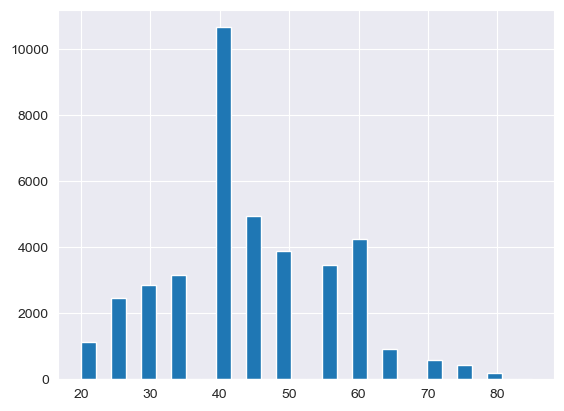

In [233]:
df_data["age"].hist(bins=30) # It's not exactly normally distributed, but it's ok I think. Lots of people at the age of 40!

Now that we've looked at `age` and confirmed that it either looks fine or looks horrible (depending on your above conclusions), we should actually make our training and testing datasets.

> __Your Task__: Create `y_reg`, a copy of the `age` column in `X_data`. Additionally, create `X_reg` by dropping `age` from `X_data`. Then, use `train_test_split` to create training and testing sets of the data. Use a random state of 42 and use 80% of the data for training. Print the shapes of the training and testing variables.

In [236]:
y_reg = X_data["age"].copy()
X_reg = X_data.drop("age", axis=1)
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, train_size=0.8, random_state=42)

print(X_train_reg.shape, X_test_reg.shape)
print(y_train_reg.shape, y_test_reg.shape)

(31187, 24) (7797, 24)
(31187,) (7797,)


Now that we have our data preprocessed, we can fit a Decision Tree Regressor on the dataset. You can find the documentation for the regressor [here](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html).

> __Your Task__: Import the `DecisionTreeRegressor` class from `sklearn.tree`. Create, fit, and score the regression model, exploring different hyperparameters for the model listed on the documentation. Save the best performing model to a variable named `best_dt_reg` and report it's score on the testing dataset. Use a random state of 42 throughout.

In [257]:
from sklearn.tree import DecisionTreeRegressor

best_dt_reg = DecisionTreeRegressor(max_depth=10, min_samples_split=10, min_samples_leaf=4, random_state=42)
best_dt_reg.fit(X_train_reg, y_train_reg)
score = best_dt_reg.score(X_test_reg, y_test_reg)

score # highest r^2

0.29453603478177026

Decision Trees are inherently interpretable, so we should attempt to interpret the results.

> __Your Task__: In the previous task, you created a Decision Tree Regressor named `best_dt_reg`. Let's interpret the regressor in two steps.

> First, use `graphviz` to visualize the tree. What patterns do you see in the tree? Which features are split on early, and which are split on later?

> Second, extract the `feature_importances_` from `best_dt_reg`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> After making your table, answer the discussion questions below.

In [261]:
dot_data = tree.export_graphviz(best_dt_reg, feature_names=X_train_reg.columns)

Source(dot_data) # Hemoglobin is the most importnat feature, then systolic, etc --> similar to those features that were the most important
# later on, last features: LDL, hemoglobin (at low levels), AST, etc

In [269]:
feat_imp_reg = pd.DataFrame({"feature": X_train_reg.columns,"importance": best_dt_reg.feature_importances_})

feat_imp_reg = feat_imp_reg.sort_values("importance", ascending=False).round(2)
feat_imp_reg

,feature,importance
8,hemoglobin,0.23
4,fasting blood sugar,0.13
0,weight(kg),0.11
2,eyesight(right),0.11
3,systolic,0.08
1,eyesight(left),0.08
10,AST,0.06
7,LDL,0.05
5,triglyceride,0.04
11,Gtp,0.02


__Discussion Q1. Do the important features make sense within the context of this smoker dataset?__


> Yes, very similar to the features that are important in the classifiers. THose are the variables I would expect from a non-smoker/smoker!

__Discussion Q2. Do these importances tell us anything about causal linkages between our predictors and `age`? Why or why not?__

> It's difficult to tell a straight causal relationship, but I think age is implicit in all the other variables because the older you become, the more likely your health is to get worse, so we expect worst hemoglobin levels, etc.
> But I think it's difficult to draw a super conclusive causal linkage

__Discussion Q3. How do the visualizations of `best_dt_reg` and `best_dt_clf`  differ?__

> Yes, they are different! I can't even open entirely one of the visualizations, but they seemed different!

__Discussion Q4. How does the "score" function differ between decision tree classifiers and regressors more broadly?__

> The score for classifiers is about how accurate your predictions are. That is, for every X, how many do we get right?
> The score for the regressor is the R^2, so it's basically how well far off our regression is from the the actual prediction: non-smoker vs. smoker!

# Conclusion

In this assignment, we predicted an individual's smoking status based on biological features.
- We modeled the relationship between these features and smoking status with two tree-based classifiers, attaining a fairly accurate result.
- We utilized the properties of the models to gain a better understanding of which features contributed the most to differentiating smokers and non smokers.
- Interpreting these results within the context of the data, i.e., the information provided by the dataset and our prior knowledge of the health impacts of smoking, allowed us to better understand the biological mechanisms through which smoking causes harm, heart disease in particular.
- Comparing the decision tree and random forest classifiers shed light on how each model's pros and cons can impact the robustness of results.

In the later section, we switched our target to a numerical variable `age` and build a decision tree regressor to predict an individual's age based on biological features. We follow the similar logic to visualize the model and interprete important features to validate model integrity. Specifically, we compared the decision tree classifier and regressor to provide an intuitive understanding of the difference between the two models in terms of node splitting criteria and scoring metrics.